# BALANCED SINGLE LABEL PROJECT

## EXTRACT AND MERGE THE DATASETS

In following steps, we analyze the two datasets, Artemis and WikiArt Dataset,  and merge them in a single dataset.

In [2]:
import pandas as pd
import numpy as np
import tensorflow as tf
import os
import random as rn
from os.path import join, getsize
from tensorflow.keras import layers
from tensorflow.keras import models
from keras.preprocessing import image
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, Callback
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.preprocessing import LabelBinarizer
import matplotlib.pyplot as plt
import matplotlib.style as style

from PIL import Image
from tqdm import tqdm

In [3]:
# The below is necessary for reproducible results of certain Python hash-based operations.
os.environ["PYTHONHASHSEED"]="0"

# The below is necessary for starting Numpy generated random numbers in a well-defined initial state.
np.random.seed(31)

# The below is necessary for starting core Python generated random numbers in a well-defined state.
rn.seed(14)

# The below tf.random.set_seed will make random number generation in TensorFlow have a well-defined initial state.
tf.random.set_seed(1234)

In [4]:
df = pd.read_csv("./artemis_official_data/official_data/artemis_dataset_release_v0.csv")

df = df.sort_values(by=['art_style'])

df = df.drop(['utterance','repetition'], axis=1)


df

,art_style,painting,emotion
228833,Abstract_Expressionism,brice-marden_joined-2011,contentment
17344,Abstract_Expressionism,louise-nevelson_sky-covenant-1973,contentment
17339,Abstract_Expressionism,mark-rothko_untitled-14b,amusement
17338,Abstract_Expressionism,kenzo-okada_white-and-brown-1972,contentment
58772,Abstract_Expressionism,jimmy-ernst_four-days-1979,contentment
...,...,...,...
197704,Ukiyo_e,kitagawa-utamaro_a-scene-on-the-bridge-and-beld-2,contentment
59050,Ukiyo_e,utagawa-toyokuni-ii_view-of-oshima-from-atami-...,contentment
135984,Ukiyo_e,ogata-gekko_nihon-hana-zue-1897-2,contentment
59035,Ukiyo_e,utagawa-kuniyoshi_woman-under-a-cherry-tree,disgust


<AxesSubplot: >

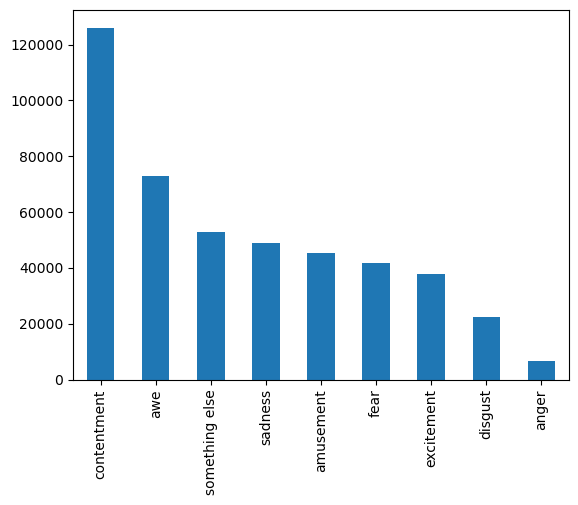

In [5]:
df['emotion'].value_counts().plot(kind='bar')

In [6]:
df = df.groupby(['art_style','painting'])['emotion'].apply(list).reset_index(name='emotions')

df['emotions'] = df['emotions'].apply(lambda x: list(x))

df['emotions']

0        [something else, amusement, fear, fear, conten...
1        [contentment, sadness, fear, fear, something e...
2        [fear, fear, fear, something else, something e...
3        [something else, disgust, contentment, disgust...
4        [something else, something else, something els...
                               ...                        
80026            [awe, contentment, amusement, fear, fear]
80027    [contentment, contentment, amusement, exciteme...
80028    [contentment, contentment, contentment, sadnes...
80029    [awe, contentment, something else, awe, conten...
80030    [contentment, contentment, something else, som...
Name: emotions, Length: 80031, dtype: object

<AxesSubplot: >

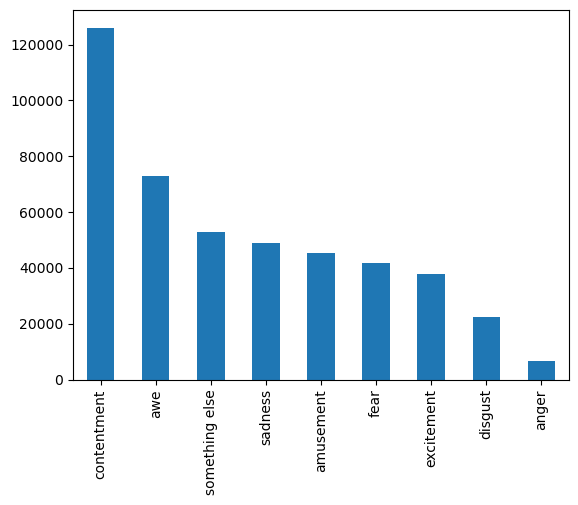

In [7]:
df_ex = df.explode('emotions')

df_ex['emotions'].value_counts().plot(kind='bar')

In [8]:

rows_df = []
for root, dirs, files in os.walk('./wikiart/'):
    if not dirs:
        for file in files:
            art_style = root.split(sep='/')[2]
            path = root + '/' + file
            painting = file.replace('.jpg', '')
            rows_df.append([art_style, painting, path])


df_paint = pd.DataFrame(rows_df,columns=['art_style','painting','path'])
df_paint

,art_style,painting,path
0,Abstract_Expressionism,aaron-siskind_acolman-1-1955,./wikiart/Abstract_Expressionism/aaron-siskind...
1,Abstract_Expressionism,aaron-siskind_chicago-1951,./wikiart/Abstract_Expressionism/aaron-siskind...
2,Abstract_Expressionism,aaron-siskind_chicago-6-1961,./wikiart/Abstract_Expressionism/aaron-siskind...
3,Abstract_Expressionism,aaron-siskind_feet-102-1957,./wikiart/Abstract_Expressionism/aaron-siskind...
4,Abstract_Expressionism,aaron-siskind_gloucester-16a-1944,./wikiart/Abstract_Expressionism/aaron-siskind...
...,...,...,...
81439,Ukiyo_e,utagawa-toyokuni_the-actor-otani-monzo-in-the-...,./wikiart/Ukiyo_e/utagawa-toyokuni_the-actor-o...
81440,Ukiyo_e,utagawa-toyokuni_the-heian-courtier,./wikiart/Ukiyo_e/utagawa-toyokuni_the-heian-c...
81441,Ukiyo_e,utagawa-toyokuni_the-promenade,./wikiart/Ukiyo_e/utagawa-toyokuni_the-promena...
81442,Ukiyo_e,utagawa-toyokuni_three-beauties-playing-battle...,./wikiart/Ukiyo_e/utagawa-toyokuni_three-beaut...


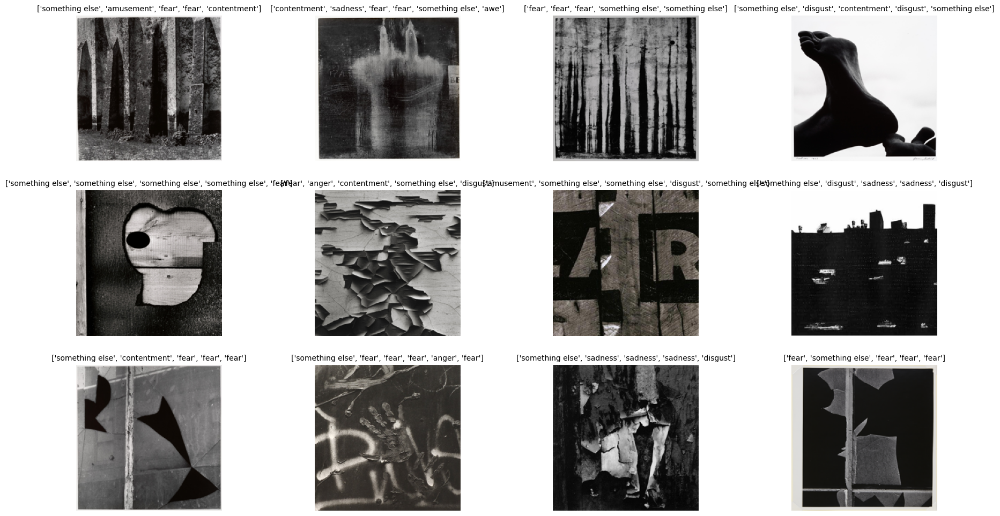

In [9]:


nobs = 12 # Maximum number of images to display
ncols = 4 # Number of columns in display
nrows = nobs//ncols # Number of rows in display

X_train = df_paint['path']
y_train = df['emotions']

style.use("default")
plt.figure(figsize=(22,4*nrows))
for i in range(nrows*ncols):
    ax = plt.subplot(nrows, ncols, i+1)
    plt.imshow(Image.open(X_train[i]).resize((224,224)))
    plt.title(y_train[i], size=10)
    plt.axis('off')

In [10]:
df_complete = pd.merge(df, df_paint,  how='left', left_on=['art_style','painting'], right_on = ['art_style','painting'])

df_complete

,art_style,painting,emotions,path
0,Abstract_Expressionism,aaron-siskind_acolman-1-1955,"[something else, amusement, fear, fear, conten...",./wikiart/Abstract_Expressionism/aaron-siskind...
1,Abstract_Expressionism,aaron-siskind_chicago-1951,"[contentment, sadness, fear, fear, something e...",./wikiart/Abstract_Expressionism/aaron-siskind...
2,Abstract_Expressionism,aaron-siskind_chicago-6-1961,"[fear, fear, fear, something else, something e...",./wikiart/Abstract_Expressionism/aaron-siskind...
3,Abstract_Expressionism,aaron-siskind_feet-102-1957,"[something else, disgust, contentment, disgust...",./wikiart/Abstract_Expressionism/aaron-siskind...
4,Abstract_Expressionism,aaron-siskind_gloucester-16a-1944,"[something else, something else, something els...",./wikiart/Abstract_Expressionism/aaron-siskind...
...,...,...,...,...
80026,Ukiyo_e,utagawa-toyokuni_the-actor-otani-monzo-in-the-...,"[awe, contentment, amusement, fear, fear]",./wikiart/Ukiyo_e/utagawa-toyokuni_the-actor-o...
80027,Ukiyo_e,utagawa-toyokuni_the-heian-courtier,"[contentment, contentment, amusement, exciteme...",./wikiart/Ukiyo_e/utagawa-toyokuni_the-heian-c...
80028,Ukiyo_e,utagawa-toyokuni_the-promenade,"[contentment, contentment, contentment, sadnes...",./wikiart/Ukiyo_e/utagawa-toyokuni_the-promena...
80029,Ukiyo_e,utagawa-toyokuni_three-beauties-playing-battle...,"[awe, contentment, something else, awe, conten...",./wikiart/Ukiyo_e/utagawa-toyokuni_three-beaut...


Check if there are any discrepancies while merging the datasets, if there are any inconsistencies then the image will not be inserted in the final dataset

In [11]:
null_data = df_complete[df_complete.isnull().any(axis=1)]
null_data

,art_style,painting,emotions,path
11298,Baroque,rembrandt_woman-standing-with-raised-hands,"[sadness, sadness, something else, amusement, ...",NaN


In [12]:
df_complete = df_complete.dropna()

## Dataset Binary class + class Miscellanous

Definition of the dataset with three classes

In [73]:
list_em = list(df_complete['emotions'])
list_em
for lists in list_em:
    for i, emotion in enumerate(lists):
        if emotion == 'amusement' or emotion == 'contentment' or emotion == 'excitement':
            lists[i] = 'Positive'
        elif emotion == 'something else':
            lists[i] = 'Miscellaneous'
        else:
            lists[i] = 'Negative'



In [74]:
list_single_emotion = []

for emotions_paint in list_em:
    num_negative = emotions_paint.count('Negative')
    num_positive = emotions_paint.count('Positive')
    num_other = emotions_paint.count('Miscellaneous')

   
    if num_negative > num_positive and num_negative >= num_other:
        list_single_emotion.append('Negative')
        print(f"Positive: {num_positive}, Negative: {num_negative}, Miscellanous: {num_other} -------> Assigned: Negative")
    
    elif num_positive > num_negative and num_positive >= num_other:
        list_single_emotion.append('Positive')
        print(f"Positive: {num_positive}, Negative: {num_negative}, Miscellanous: {num_other} -------> Assigned: Positive")

    elif (num_other > num_negative and num_other > num_positive) or (num_positive == num_negative):
        list_single_emotion.append('Miscellaneous') 
        print(f"Positive: {num_positive}, Negative: {num_negative}, Miscellanous: {num_other} -------> Assigned: Miscellaneous")

print(f"List 1:{len(list_em)}, List 2: {len(list_single_emotion)}")

Positive: 2, Negative: 2, Miscellanous: 1 -------> Assigned: Miscellaneous
Positive: 1, Negative: 4, Miscellanous: 1 -------> Assigned: Negative
Positive: 0, Negative: 3, Miscellanous: 2 -------> Assigned: Negative
Positive: 1, Negative: 2, Miscellanous: 2 -------> Assigned: Negative
Positive: 0, Negative: 1, Miscellanous: 4 -------> Assigned: Miscellaneous
Positive: 1, Negative: 3, Miscellanous: 1 -------> Assigned: Negative
Positive: 1, Negative: 1, Miscellanous: 3 -------> Assigned: Miscellaneous
Positive: 0, Negative: 4, Miscellanous: 1 -------> Assigned: Negative
Positive: 1, Negative: 3, Miscellanous: 1 -------> Assigned: Negative
Positive: 0, Negative: 5, Miscellanous: 1 -------> Assigned: Negative
Positive: 0, Negative: 4, Miscellanous: 1 -------> Assigned: Negative
Positive: 0, Negative: 4, Miscellanous: 1 -------> Assigned: Negative
Positive: 1, Negative: 2, Miscellanous: 2 -------> Assigned: Negative
Positive: 3, Negative: 4, Miscellanous: 0 -------> Assigned: Negative
Posit

In [75]:
df_complete['emotions'] = list_single_emotion

df_complete

C:\Users\lioma\AppData\Local\Temp\ipykernel_11712\3700699993.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_complete['emotions'] = list_single_emotion


,art_style,painting,emotions,path
0,Abstract_Expressionism,aaron-siskind_acolman-1-1955,Miscellaneous,./wikiart/Abstract_Expressionism/aaron-siskind...
1,Abstract_Expressionism,aaron-siskind_chicago-1951,Negative,./wikiart/Abstract_Expressionism/aaron-siskind...
2,Abstract_Expressionism,aaron-siskind_chicago-6-1961,Negative,./wikiart/Abstract_Expressionism/aaron-siskind...
3,Abstract_Expressionism,aaron-siskind_feet-102-1957,Negative,./wikiart/Abstract_Expressionism/aaron-siskind...
4,Abstract_Expressionism,aaron-siskind_gloucester-16a-1944,Miscellaneous,./wikiart/Abstract_Expressionism/aaron-siskind...
...,...,...,...,...
80026,Ukiyo_e,utagawa-toyokuni_the-actor-otani-monzo-in-the-...,Negative,./wikiart/Ukiyo_e/utagawa-toyokuni_the-actor-o...
80027,Ukiyo_e,utagawa-toyokuni_the-heian-courtier,Positive,./wikiart/Ukiyo_e/utagawa-toyokuni_the-heian-c...
80028,Ukiyo_e,utagawa-toyokuni_the-promenade,Positive,./wikiart/Ukiyo_e/utagawa-toyokuni_the-promena...
80029,Ukiyo_e,utagawa-toyokuni_three-beauties-playing-battle...,Miscellaneous,./wikiart/Ukiyo_e/utagawa-toyokuni_three-beaut...


In [76]:
null_data_2 = df_complete[df_complete.isnull().any(axis=1)]
null_data_2

,art_style,painting,emotions,path


<AxesSubplot: >

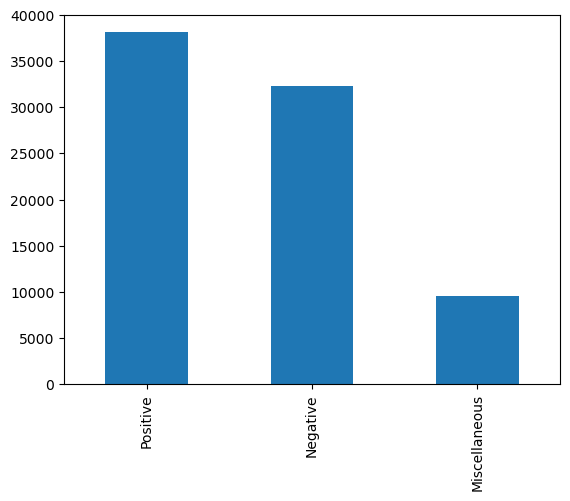

In [77]:
df_complete['emotions'].value_counts().plot(kind='bar')

In [78]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(df_complete['path'], df_complete['emotions'], train_size=0.7, random_state=44)
X_val, X_test, y_val, y_test = train_test_split(X_val, y_val, train_size=0.5, random_state=44)
print("Number of paint for training: ", len(X_train))
print("Number of paint for validation: ", len(X_val))
print("Number of paint for validation: ", len(X_test))

Number of paint for training:  56021
Number of paint for validation:  12004
Number of paint for validation:  12005


In [79]:
X_train = [os.path.join('',str(f)) for f in X_train]
X_val = [os.path.join('',str(f)) for f in X_val]
X_test = [os.path.join('',str(f)) for f in X_test]

In [80]:
y_train = list(y_train)
y_val = list(y_val)
y_test = list(y_test)

In [81]:
lb = LabelBinarizer()
lb.fit(y_train)
N_LABELS = len(lb.classes_)

for (i, label) in enumerate(lb.classes_):
    print("{}. {}".format(i, label))


0. Miscellaneous
1. Negative
2. Positive


In [82]:
y_train_bin = lb.transform(y_train)
y_val_bin = lb.transform(y_val)
y_test_bin = lb.transform(y_test)

for i in range(5):
    print(X_train[i], y_train_bin[i])

./wikiart/Art_Nouveau_Modern/heorhiy-narbut_galicia-governorate-coat-of-arms-1914.jpg [0 1 0]
./wikiart/Impressionism/mary-cassatt_susan-comforting-the-baby-no-1.jpg [0 0 1]
./wikiart/Art_Nouveau_Modern/felix-vallotton_portrait-of-french-writer-douard-dujardin-1898.jpg [0 0 1]
./wikiart/Realism/vincent-van-gogh_peasant-seen-from-the-back-and-three-hands-holding-a-stick-1885.jpg [0 1 0]
./wikiart/Realism/volodymyr-orlovsky_summer-day-in-ukraine-1892.jpg [1 0 0]


Visualization of the distribution of the data in train, validation and test set

Train set distribution --> Miscellanous:6680, Negative: 22562, Positive: 26779
Validation set distribution --> Miscellanous:1432, Negative: 4878, Positive: 5694
Test set distribution --> Miscellanous:1473, Negative: 4858, Positive: 5674


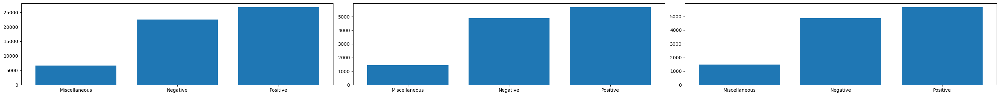

In [83]:
total_distribution_train = np.zeros(3)
total_distribution_val = np.zeros(3)
total_distribution_test = np.zeros(3)

for label in y_train_bin:
    total_distribution_train = np.add(total_distribution_train, label)

for label in y_val_bin:
    total_distribution_val = np.add(total_distribution_val, label)

for label in y_test_bin:
    total_distribution_test = np.add(total_distribution_test, label)

print('Train set distribution --> ' + 'Miscellanous:' + str(int(total_distribution_train[0])) + ', Negative: '+str(int(total_distribution_train[1]))+', Positive: '+ str(int(total_distribution_train[2])))
print('Validation set distribution --> ' + 'Miscellanous:' + str(int(total_distribution_val[0])) + ', Negative: '+str(int(total_distribution_val[1]))+', Positive: '+ str(int(total_distribution_val[2])))
print('Test set distribution --> ' + 'Miscellanous:' + str(int(total_distribution_test[0])) + ', Negative: '+str(int(total_distribution_test[1]))+', Positive: '+ str(int(total_distribution_test[2])))
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(30, 3))
axes[0].bar(lb.classes_,total_distribution_train, align='center')
axes[1].bar(lb.classes_,total_distribution_val, align='center')
axes[2].bar(lb.classes_,total_distribution_test, align='center')

fig.tight_layout()


### BUILD DATASET

Now salve the train, validation and test set in a proprer way.

Utility functions

In [84]:
def data_modification_function(image):
    """This function flip or rotate the image"""

    if rn.random() > 0.5: #flip the image
        flip_up_down = rn.random()
        if flip_up_down > 0.5:
            mod_image = tf.image.flip_up_down(image)
        else:
            mod_image = tf.image.flip_left_right(image)
    else:
        rotation = rn.randint(1,3)
        mod_image = tf.image.rot90(image, rotation)

    return np.asarray(mod_image)

#put the images in the correct folders
def save_set(X, y, path, label_list = True):

    for i, image in enumerate(X):
        name = image.split('/')[3]
        img = tf.io.read_file(image)
        img = tf.image.decode_jpeg(img, dct_method='INTEGER_ACCURATE')
        #plt.imshow(Image.open(image))
        img_enc = tf.image.encode_jpeg(img)
        if label_list:
            tf.io.write_file(tf.constant(path + y[i]+'/'+name), img_enc)
        else:
            tf.io.write_file(tf.constant(path + y+'/'+name), img_enc)

def data_augmentation_minority_class (X, y, path):
    # need to triplicate the miscellanous class
    N_repetition = 2

    for i in range(N_repetition):
        for image in X:
            name = image.split('/')[3]

            img = tf.io.read_file(image)
            img = tf.image.decode_jpeg(img, dct_method='INTEGER_ACCURATE')
            mod_img = data_modification_function(img)
            img_enc = tf.image.encode_jpeg(mod_img)
            tf.io.write_file(tf.constant(path + y+'/'+name+'_modification_'+str(i+1)+'.jpg'), img_enc)

In [85]:
num_samples_per_class = 20040
#now divide the training set per class
negative_train_sample = []
positive_train_sample = []
miscellanous_train_sample = []
for i, image in enumerate(X_train):
    if y_train[i] == lb.classes_[0]:
        miscellanous_train_sample.append(image)
    elif y_train[i] == lb.classes_[1]:
        negative_train_sample.append(image)
    else:
        positive_train_sample.append(image)

print(len(negative_train_sample), len(positive_train_sample))

negative_train_sample = rn.sample(negative_train_sample, num_samples_per_class) #sampling without replacement
positive_train_sample = rn.sample(positive_train_sample, num_samples_per_class) #sampling without replacement

print(len(negative_train_sample), len(positive_train_sample))

22562 26779
20040 20040


Text(0.5, 1.0, 'Modified')

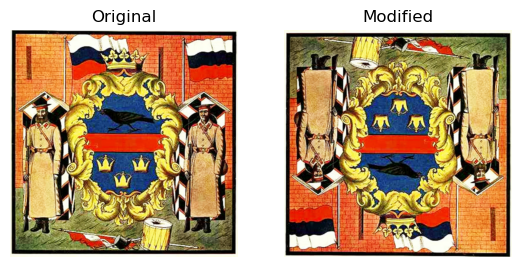

In [86]:
img = tf.io.read_file(X_train[0])
img = tf.image.decode_jpeg(img)
mod_img = data_modification_function(img)
fig = plt.figure(figsize=(10, 10))

fig.add_subplot(2, 3, 1)
plt.imshow(img)
plt.axis('off')
plt.title("Original")

fig.add_subplot(2, 3, 2)
plt.imshow(mod_img)
plt.axis('off')
plt.title("Modified")


In [87]:
#create the structure of the folders
import shutil

path_dataset = './dataset_splitted_balanced/'
path_train = path_dataset + 'train/'
path_validation = path_dataset + 'validation/'
path_test = path_dataset + 'test/'
path_train_miscellanous = path_train + 'Miscellanous/'
path_train_positive = path_train + 'Positive/'
path_train_negative = path_train + 'Negative/'

path_validation_miscellanous = path_validation + 'Miscellanous/'
path_validation_positive = path_validation + 'Positive/'
path_validation_negative = path_validation + 'Negative/'

path_test_miscellanous = path_test + 'Miscellanous/'
path_test_positive = path_test + 'Positive/'
path_test_negative = path_test + 'Negative/'



In [88]:
shutil.rmtree(path_dataset, ignore_errors=True)

os.makedirs(path_dataset)
os.makedirs(path_train)
os.makedirs(path_validation)
os.makedirs(path_test)

os.makedirs(path_train_miscellanous)
os.makedirs(path_train_positive)
os.makedirs(path_train_negative)

os.makedirs(path_validation_miscellanous)
os.makedirs(path_validation_positive)
os.makedirs(path_validation_negative)

os.makedirs(path_test_miscellanous)
os.makedirs(path_test_positive)
os.makedirs(path_test_negative)

In [89]:
save_set(X_test, y_test, path_test)
save_set(X_val, y_val, path_validation)

In [90]:
save_set(negative_train_sample, 'Negative', path_train, False)
save_set(positive_train_sample, 'Positive', path_train, False)
save_set(miscellanous_train_sample, 'Miscellanous', path_train, False)

In [34]:
data_augmentation_minority_class(miscellanous_train_sample, 'Miscellanous', path_train)

In [26]:
#
#
#
#
#
#
#
#
#
#
#
#
#
# 
# 
# 
# 
# 
# 
# 
# 
# 
# 
# 
# 
# 
# 
# 
# 
# 
# 
# 
# 
# ###

## Build Dataset Multi-Class (all the emotions)

### costruction

In [13]:
list_emotions = list(df_complete['emotions'])
list_emotions

[['something else', 'amusement', 'fear', 'fear', 'contentment'],
 ['contentment', 'sadness', 'fear', 'fear', 'something else', 'awe'],
 ['fear', 'fear', 'fear', 'something else', 'something else'],
 ['something else', 'disgust', 'contentment', 'disgust', 'something else'],
 ['something else',
  'something else',
  'something else',
  'something else',
  'fear'],
 ['fear', 'anger', 'contentment', 'something else', 'disgust'],
 ['amusement',
  'something else',
  'something else',
  'disgust',
  'something else'],
 ['something else', 'disgust', 'sadness', 'sadness', 'disgust'],
 ['something else', 'contentment', 'fear', 'fear', 'fear'],
 ['something else', 'fear', 'fear', 'fear', 'anger', 'fear'],
 ['something else', 'sadness', 'sadness', 'sadness', 'disgust'],
 ['fear', 'something else', 'fear', 'fear', 'fear'],
 ['something else', 'amusement', 'something else', 'fear', 'fear'],
 ['excitement', 'fear', 'awe', 'excitement', 'contentment', 'awe', 'awe'],
 ['something else',
  'something e

In [14]:
index_emotions_number = []
for i, emotions in enumerate(list_emotions):
    et = pd.Series(emotions).value_counts()
    dictionary = et.to_dict()
    index_emotions_number.append([i, dictionary, len(dictionary)])
    print(i, dictionary, len(dictionary))

0 {'fear': 2, 'something else': 1, 'amusement': 1, 'contentment': 1} 4
1 {'fear': 2, 'contentment': 1, 'sadness': 1, 'something else': 1, 'awe': 1} 5
2 {'fear': 3, 'something else': 2} 2
3 {'something else': 2, 'disgust': 2, 'contentment': 1} 3
4 {'something else': 4, 'fear': 1} 2
5 {'fear': 1, 'anger': 1, 'contentment': 1, 'something else': 1, 'disgust': 1} 5
6 {'something else': 3, 'amusement': 1, 'disgust': 1} 3
7 {'disgust': 2, 'sadness': 2, 'something else': 1} 3
8 {'fear': 3, 'something else': 1, 'contentment': 1} 3
9 {'fear': 4, 'something else': 1, 'anger': 1} 3
10 {'sadness': 3, 'something else': 1, 'disgust': 1} 3
11 {'fear': 4, 'something else': 1} 2
12 {'something else': 2, 'fear': 2, 'amusement': 1} 3
13 {'awe': 3, 'excitement': 2, 'fear': 1, 'contentment': 1} 4
14 {'something else': 3, 'sadness': 1, 'disgust': 1, 'awe': 1} 4
15 {'sadness': 2, 'fear': 1, 'disgust': 1, 'something else': 1} 4
16 {'fear': 2, 'something else': 1, 'disgust': 1, 'excitement': 1} 4
17 {'fear': 2,

### Evaluation of the label to choose: Percentage evaluation

In [ ]:
index_emotions_percentage = []
for element in index_emotions_number:
    sum_value = sum(list(element[1].values()))
    result = {key: value / sum_value for key, value in element[1].items()}
    index_emotions_percentage.append([element[0], result, element[2]])

index_emotions_percentage

In [16]:
list_perc_emotions = []
only_perc_emotions = []
list_perc_emotions_numExpression = []
for paint in index_emotions_percentage:
    keys = list(paint[1].keys())
    values = list(paint[1].values())
    
    if values.count(values[0]) == len(values) and paint[2] > 1:
        list_perc_emotions.append([paint[0], 'something else'])
        only_perc_emotions.append('something else')
    else:
        list_indexes = np.argwhere(values == np.amax(values))
        indexes = list_indexes.flatten().tolist()
        if len(indexes) > 1 and paint[2] > 1:
            list_perc_emotions.append([paint[0], 'something else'])
            only_perc_emotions.append('something else')
        else:
            index = np.argmax(values)
            em = keys[index]
            list_perc_emotions.append([paint[0], em])
            only_perc_emotions.append(em)

len(list_perc_emotions)

80030

In [17]:
et_perc = pd.Series(only_perc_emotions).value_counts()
et_perc

something else    25455
contentment       23592
awe                8749
sadness            6298
fear               5625
amusement          5398
excitement         2986
disgust            1680
anger               247
dtype: int64

### Evaluation of the label to choose: Norm Evaluation (we use this method to choose the label for each paintings)

In [ ]:
index_emotions_norm = []
for element in index_emotions_number:
    max_value = max(list(element[1].values()))
    sum_value = sum(list(element[1].values()))
    result_max = {key: value / max_value for key, value in element[1].items()}
    result_sum = {key: value / sum_value for key, value in element[1].items()}
    index_emotions_norm.append([element[0], result_max, result_sum, element[2]])

index_emotions_norm

In [26]:
list_norm_emotions = []
only_norm_emotions = []
list_norm_emotions_numExpression = []
for paint in index_emotions_norm:
    keys = list(paint[1].keys())
    values = list(paint[1].values())
    values_max = list(paint[2].values())
    
    if values.count(values[0]) == len(values) and paint[3] > 1:
        list_norm_emotions.append([paint[0], 'something else'])
        only_norm_emotions.append('something else')
    else:
        list_indexes = np.argwhere(values == np.amax(values))
        indexes = list_indexes.flatten().tolist()
        if len(indexes) > 1 and paint[3] > 1:
            list_norm_emotions.append([paint[0], 'something else'])
            only_norm_emotions.append('something else')
        else:
            index = np.argmax(values)
            #indexes = np.argsort(-values)
            if len(values) > 1:
                if values[index] - values[index + 1] <= 0.5:
                    list_norm_emotions.append([paint[0], 'something else'])
                    only_norm_emotions.append('something else')
                else:
                    if values_max[index] >= 0.5:
                        em = keys[index]
                        list_norm_emotions.append([paint[0], em])
                        only_norm_emotions.append(em)
                    else:
                       list_norm_emotions.append([paint[0], 'something else'])
                       only_norm_emotions.append('something else')  
            else:
                em = keys[index]
                list_norm_emotions.append([paint[0], em])
                only_norm_emotions.append(em)

len(list_norm_emotions)

80030

In [27]:
et_norm = pd.Series(only_norm_emotions).value_counts()
et_norm

something else    53784
contentment       13438
awe                3601
sadness            3023
fear               2625
amusement          2176
excitement          909
disgust             446
anger                28
dtype: int64

### Exploring the data

In [23]:
paint_single_emotion = []
for element in index_emotions_number:
    if element[2] == 1:
        paint_single_emotion.append(element)

len(paint_single_emotion)

1707

In [28]:
list_single_emotion = []
for paint in paint_single_emotion:
    list_single_emotion.append(list(paint[1].keys())[0])

et = pd.Series(list_single_emotion).value_counts()
et

contentment       1074
sadness            243
fear               162
awe                128
amusement           70
something else      15
excitement          12
disgust              3
dtype: int64

In [29]:
paint_two_emotion = []
for element in index_emotions_number:
    if element[2] == 2:
        paint_two_emotion.append(element)

len(paint_two_emotion)

13147

In [37]:
paint_three_emotion = []
for element in index_emotions_number:
    if element[2] == 3:
        paint_three_emotion.append(element)

len(paint_three_emotion)

30523

In [41]:
paint_four_emotion = []
for element in index_emotions_number:
    if element[2] == 4:
        paint_four_emotion.append(element)

len(paint_four_emotion)

26003

In [50]:
paint_five_emotion = []
for element in index_emotions_number:
    if element[2] == 5:
        paint_five_emotion.append(element)

len(paint_five_emotion)

7237

In [55]:
paint_six_emotion = []
for element in index_emotions_number:
    if element[2] == 6:
        paint_six_emotion.append(element)

len(paint_six_emotion)

789

In [56]:
paint_seven_emotion = []
for element in index_emotions_number:
    if element[2] == 7:
        paint_seven_emotion.append(element)

len(paint_seven_emotion)

303

In [57]:
paint_eight_emotion = []
for element in index_emotions_number:
    if element[2] == 8:
        paint_eight_emotion.append(element)

len(paint_eight_emotion)

224

In [58]:
paint_nine_emotion = []
for element in index_emotions_number:
    if element[2] == 9:
        paint_nine_emotion.append(element)

len(paint_nine_emotion)

97

In [32]:
list_two_emotions = []
plot_two_emotions = []
for paint_two in paint_two_emotion:
    keys = list(paint_two[1].keys())
    values = list(paint_two[1].values())
    
    if values.count(values[0]) == len(values):
        list_two_emotions.append([paint_two[0], 'something else'])
        plot_two_emotions.append('something else')
    else:
        index = np.argmax(values)
        em = keys[index]
        list_two_emotions.append([paint_two[0], em])
        plot_two_emotions.append(em)

#list_two_emotions

In [ ]:
list_three_emotions = []
plot_three_emotions = []
for paint_three in paint_three_emotion:
    keys = list(paint_three[1].keys())
    values = list(paint_three[1].values())
    
    if values.count(values[0]) == len(values):
        list_three_emotions.append([paint_three[0], 'something else'])
        plot_three_emotions.append('something else')
    else:
        list_indexes = np.argwhere(values == np.amax(values))
        indexes = list_indexes.flatten().tolist()
        if len(indexes) > 1:
            list_three_emotions.append([paint_three[0], 'something else'])
            plot_three_emotions.append('something else')
        else:
            index = np.argmax(values)
            em = keys[index]
            list_three_emotions.append([paint_three[0], em])
            plot_three_emotions.append(em)

list_three_emotions

In [43]:
list_four_emotions = []
plot_four_emotions = []
for paint_four in paint_four_emotion:
    keys = list(paint_four[1].keys())
    values = list(paint_four[1].values())
    
    if values.count(values[0]) == len(values):
        list_four_emotions.append([paint_four[0], 'something else'])
        plot_four_emotions.append('something else')
    else:
        list_indexes = np.argwhere(values == np.amax(values))
        indexes = list_indexes.flatten().tolist()
        if len(indexes) > 1:
            list_four_emotions.append([paint_four[0], 'something else'])
            plot_four_emotions.append('something else')
        else:
            index = np.argmax(values)
            em = keys[index]
            list_four_emotions.append([paint_four[0], em])
            plot_four_emotions.append(em)

len(list_four_emotions)

26003

In [52]:
list_five_emotions = []
plot_five_emotions = []
for paint_five in paint_five_emotion:
    keys = list(paint_five[1].keys())
    values = list(paint_five[1].values())
    
    if values.count(values[0]) == len(values):
        list_five_emotions.append([paint_five[0], 'something else'])
        plot_five_emotions.append('something else')
    else:
        list_indexes = np.argwhere(values == np.amax(values))
        indexes = list_indexes.flatten().tolist()
        if len(indexes) > 1:
            list_five_emotions.append([paint_five[0], 'something else'])
            plot_five_emotions.append('something else')
        else:
            index = np.argmax(values)
            em = keys[index]
            list_five_emotions.append([paint_five[0], em])
            plot_five_emotions.append(em)

len(list_five_emotions)

7237

In [59]:
list_six_emotions = []
plot_six_emotions = []
for paint_six in paint_six_emotion:
    keys = list(paint_six[1].keys())
    values = list(paint_six[1].values())
    
    if values.count(values[0]) == len(values):
        list_six_emotions.append([paint_six[0], 'something else'])
        plot_six_emotions.append('something else')
    else:
        list_indexes = np.argwhere(values == np.amax(values))
        indexes = list_indexes.flatten().tolist()
        if len(indexes) > 1:
            list_six_emotions.append([paint_six[0], 'something else'])
            plot_six_emotions.append('something else')
        else:
            index = np.argmax(values)
            em = keys[index]
            list_six_emotions.append([paint_six[0], em])
            plot_six_emotions.append(em)

len(list_six_emotions)

789

In [60]:
list_seven_emotions = []
plot_seven_emotions = []
for paint_seven in paint_seven_emotion:
    keys = list(paint_seven[1].keys())
    values = list(paint_seven[1].values())
    
    if values.count(values[0]) == len(values):
        list_seven_emotions.append([paint_seven[0], 'something else'])
        plot_seven_emotions.append('something else')
    else:
        list_indexes = np.argwhere(values == np.amax(values))
        indexes = list_indexes.flatten().tolist()
        if len(indexes) > 1:
            list_seven_emotions.append([paint_seven[0], 'something else'])
            plot_seven_emotions.append('something else')
        else:
            index = np.argmax(values)
            em = keys[index]
            list_seven_emotions.append([paint_seven[0], em])
            plot_seven_emotions.append(em)

len(list_seven_emotions)

303

In [61]:
list_eight_emotions = []
plot_eight_emotions = []
for paint_eight in paint_eight_emotion:
    keys = list(paint_eight[1].keys())
    values = list(paint_eight[1].values())
    
    if values.count(values[0]) == len(values):
        list_eight_emotions.append([paint_eight[0], 'something else'])
        plot_eight_emotions.append('something else')
    else:
        list_indexes = np.argwhere(values == np.amax(values))
        indexes = list_indexes.flatten().tolist()
        if len(indexes) > 1:
            list_eight_emotions.append([paint_eight[0], 'something else'])
            plot_eight_emotions.append('something else')
        else:
            index = np.argmax(values)
            em = keys[index]
            list_eight_emotions.append([paint_eight[0], em])
            plot_eight_emotions.append(em)

len(list_eight_emotions)

224

In [62]:
list_nine_emotions = []
plot_nine_emotions = []
for paint_nine in paint_nine_emotion:
    keys = list(paint_nine[1].keys())
    values = list(paint_nine[1].values())
    
    if values.count(values[0]) == len(values):
        list_nine_emotions.append([paint_nine[0], 'something else'])
        plot_nine_emotions.append('something else')
    else:
        list_indexes = np.argwhere(values == np.amax(values))
        indexes = list_indexes.flatten().tolist()
        if len(indexes) > 1:
            list_nine_emotions.append([paint_nine[0], 'something else'])
            plot_nine_emotions.append('something else')
        else:
            index = np.argmax(values)
            em = keys[index]
            list_nine_emotions.append([paint_nine[0], em])
            plot_nine_emotions.append(em)

len(list_nine_emotions)

97

In [ ]:
et_two = pd.Series(plot_two_emotions).value_counts()
et_two

In [ ]:
et_three = pd.Series(plot_three_emotions).value_counts()
et_three

In [44]:
et_four = pd.Series(plot_four_emotions).value_counts()
et_four

contentment       6615
something else    6056
awe               3532
amusement         2485
sadness           2413
fear              2254
excitement        1544
disgust            940
anger              164
dtype: int64

In [53]:
et_five = pd.Series(plot_five_emotions).value_counts()
et_five

something else    4894
contentment        667
awe                410
amusement          307
fear               278
sadness            253
excitement         228
disgust            160
anger               40
dtype: int64

In [63]:
et_six = pd.Series(plot_six_emotions).value_counts()
et_six


something else    436
contentment       162
fear               50
amusement          34
awe                34
sadness            33
excitement         22
disgust            18
dtype: int64

In [64]:
et_seven = pd.Series(plot_seven_emotions).value_counts()
et_seven

contentment       112
something else     72
sadness            34
amusement          23
awe                23
fear               17
excitement         13
disgust             8
anger               1
dtype: int64

In [65]:
et_eight = pd.Series(plot_eight_emotions).value_counts()
et_eight

contentment       85
something else    52
fear              24
awe               19
sadness           19
amusement         12
excitement         8
disgust            5
dtype: int64

In [66]:
et_nine = pd.Series(plot_nine_emotions).value_counts()
et_nine

contentment       28
something else    24
sadness           12
amusement         11
awe                7
fear               6
excitement         5
disgust            4
dtype: int64

In [36]:
listy = [2, 2]
winner = np.argwhere(listy == np.amax(listy))
ppp = winner.flatten().tolist()
len(ppp)

2

In [30]:
from collections import Counter

list_em = []

for emotions in list_emotions:
    c = Counter(emotions)
    max_keys = [key for key, value in c.items() if value == max(c.values())]
    
    if len(max_keys) == 1:
        if max_keys[0] == 'something else':
            list_em.append('miscellaneous')
        else:
            list_em.append(max_keys[0])
    elif len(max_keys) == 2 and 'something else' in max_keys:
        max_keys.remove('something else')
        list_em.append(max_keys[0])
    else:
        list_em.append('miscellaneous')


#print(list_em)

### Analysis and Visualization of the distribution of the data

In [29]:
#df_complete['emotions'] = list_em


df_complete['emotions'] = only_norm_emotions

df_complete

C:\Users\lioma\AppData\Local\Temp\ipykernel_876\958145114.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_complete['emotions'] = only_norm_emotions


,art_style,painting,emotions,path
0,Abstract_Expressionism,aaron-siskind_acolman-1-1955,something else,./wikiart/Abstract_Expressionism/aaron-siskind...
1,Abstract_Expressionism,aaron-siskind_chicago-1951,something else,./wikiart/Abstract_Expressionism/aaron-siskind...
2,Abstract_Expressionism,aaron-siskind_chicago-6-1961,something else,./wikiart/Abstract_Expressionism/aaron-siskind...
3,Abstract_Expressionism,aaron-siskind_feet-102-1957,something else,./wikiart/Abstract_Expressionism/aaron-siskind...
4,Abstract_Expressionism,aaron-siskind_gloucester-16a-1944,something else,./wikiart/Abstract_Expressionism/aaron-siskind...
...,...,...,...,...
80026,Ukiyo_e,utagawa-toyokuni_the-actor-otani-monzo-in-the-...,something else,./wikiart/Ukiyo_e/utagawa-toyokuni_the-actor-o...
80027,Ukiyo_e,utagawa-toyokuni_the-heian-courtier,something else,./wikiart/Ukiyo_e/utagawa-toyokuni_the-heian-c...
80028,Ukiyo_e,utagawa-toyokuni_the-promenade,contentment,./wikiart/Ukiyo_e/utagawa-toyokuni_the-promena...
80029,Ukiyo_e,utagawa-toyokuni_three-beauties-playing-battle...,something else,./wikiart/Ukiyo_e/utagawa-toyokuni_three-beaut...


In [30]:
null_data_3 = df_complete[df_complete.isnull().any(axis=1)]
null_data_3

,art_style,painting,emotions,path


In [31]:
df_complete['emotions'].value_counts()

something else    53784
contentment       13438
awe                3601
sadness            3023
fear               2625
amusement          2176
excitement          909
disgust             446
anger                28
Name: emotions, dtype: int64

something else    53784
contentment       13438
awe                3601
sadness            3023
fear               2625
amusement          2176
excitement          909
disgust             446
anger                28
Name: emotions, dtype: int64


<AxesSubplot: >

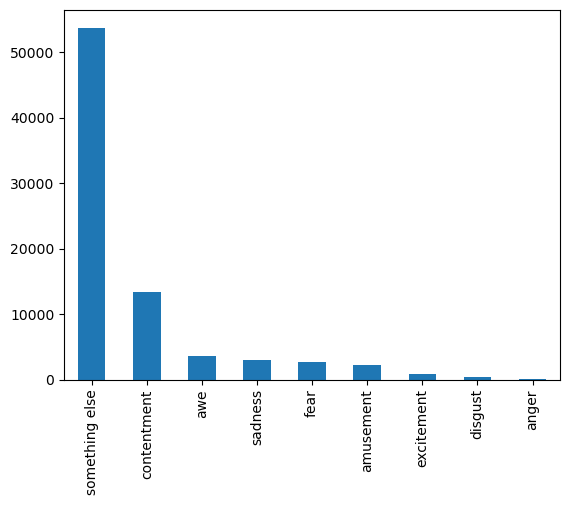

In [32]:
print(df_complete['emotions'].value_counts())
df_complete['emotions'].value_counts().plot(kind='bar')

contentment    13438
awe             3601
sadness         3023
fear            2625
amusement       2176
excitement       909
disgust          446
Name: emotions, dtype: int64


<AxesSubplot: >

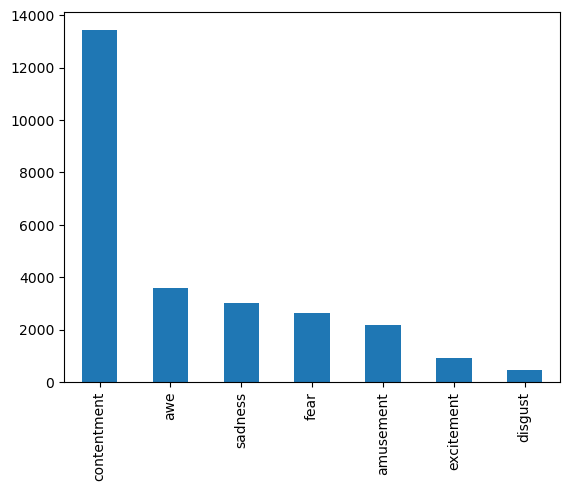

In [37]:
df_filter = df_complete[df_complete['emotions'] != 'something else']
df_filter_complete = df_filter[df_filter['emotions'] != 'anger']
print(df_filter_complete['emotions'].value_counts())
df_filter_complete['emotions'].value_counts().plot(kind='bar')

In [38]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(df_filter_complete['path'], df_filter_complete['emotions'], train_size=0.8, random_state=44)
X_val, X_test, y_val, y_test = train_test_split(X_val, y_val, train_size=0.5, random_state=44)
print("Number of paint for training: ", len(X_train))
print("Number of paint for validation: ", len(X_val))
print("Number of paint for validation: ", len(X_test))

Number of paint for training:  20974
Number of paint for validation:  2622
Number of paint for validation:  2622


In [39]:
X_train = [os.path.join('',str(f)) for f in X_train]
X_val = [os.path.join('',str(f)) for f in X_val]
X_test = [os.path.join('',str(f)) for f in X_test]

In [40]:
y_train = list(y_train)
y_val = list(y_val)
y_test = list(y_test)

In [41]:
lb = LabelBinarizer()
lb.fit(y_train)
N_LABELS = len(lb.classes_)

for (i, label) in enumerate(lb.classes_):
    print("{}. {}".format(i, label))

0. amusement
1. awe
2. contentment
3. disgust
4. excitement
5. fear
6. sadness


In [42]:
y_train_bin = lb.transform(y_train)
y_val_bin = lb.transform(y_val)
y_test_bin = lb.transform(y_test)

for i in range(5):
    print(X_train[i], y_train_bin[i])

./wikiart/Impressionism/john-henry-twachtman_view-along-a-river.jpg [0 0 1 0 0 0 0]
./wikiart/Rococo/vladimir-borovikovsky_maria-norova-1799.jpg [0 0 1 0 0 0 0]
./wikiart/Post_Impressionism/pyotr-konchalovsky_still-life-with-begonia-1916.jpg [0 0 1 0 0 0 0]
./wikiart/Romanticism/jan-matejko_to-stanczyk.jpg [1 0 0 0 0 0 0]
./wikiart/Abstract_Expressionism/atsuko-tanaka_untitled.jpg [1 0 0 0 0 0 0]


Train set distribution --> amusement:1748, awe: 2866, contentment: 10791, disgust: 362, excitement: 752, fear: 2087, sadness: 2368
Validation set distribution --> amusement:225, awe: 353, contentment: 1324, disgust: 33, excitement: 84, fear: 260, sadness: 343
Test set distribution --> amusement:203, awe: 382, contentment: 1323, disgust: 51, excitement: 73, fear: 278, sadness: 312


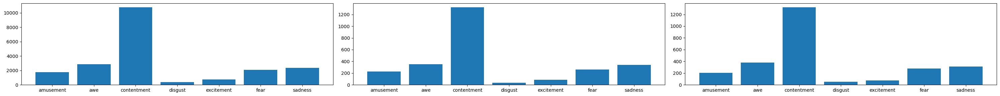

In [44]:
total_distribution_train = np.zeros(7)
total_distribution_val = np.zeros(7)
total_distribution_test = np.zeros(7)

for label in y_train_bin:
    total_distribution_train = np.add(total_distribution_train, label)

for label in y_val_bin:
    total_distribution_val = np.add(total_distribution_val, label)

for label in y_test_bin:
    total_distribution_test = np.add(total_distribution_test, label)

print('Train set distribution --> ' + 'amusement:' + str(int(total_distribution_train[0])) + 
                                    ', awe: '+str(int(total_distribution_train[1]))+
                                    ', contentment: '+ str(int(total_distribution_train[2]))+
                                    ', disgust: '+ str(int(total_distribution_train[3]))+
                                    ', excitement: '+ str(int(total_distribution_train[4]))+
                                    ', fear: '+ str(int(total_distribution_train[5]))+
                                    ', sadness: '+ str(int(total_distribution_train[6])))

print('Validation set distribution --> ' + 'amusement:' + str(int(total_distribution_val[0])) +
                                         ', awe: '+str(int(total_distribution_val[1]))+
                                         ', contentment: '+ str(int(total_distribution_val[2]))+
                                         ', disgust: '+ str(int(total_distribution_val[3]))+
                                         ', excitement: '+ str(int(total_distribution_val[4]))+
                                         ', fear: '+ str(int(total_distribution_val[5]))+
                                         ', sadness: '+ str(int(total_distribution_val[6])))

print('Test set distribution --> ' + 'amusement:' + str(int(total_distribution_test[0])) +
                                     ', awe: '+str(int(total_distribution_test[1]))+
                                     ', contentment: '+ str(int(total_distribution_test[2]))+
                                     ', disgust: '+ str(int(total_distribution_test[3]))+
                                     ', excitement: '+ str(int(total_distribution_test[4]))+
                                     ', fear: '+ str(int(total_distribution_test[5]))+
                                     ', sadness: '+ str(int(total_distribution_test[6])))
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(30, 3))
axes[0].bar(lb.classes_,total_distribution_train, align='center')
axes[1].bar(lb.classes_,total_distribution_val, align='center')
axes[2].bar(lb.classes_,total_distribution_test, align='center')

fig.tight_layout()

### Build Dataset Multi-class

As did on the previous section with the dataset with two classes

In [170]:
def data_modification_function(image):
    """This function flip or rotate the image"""
    if rn.random() > 0.5: #flip the image
        flip_up_down = rn.random()
        if flip_up_down > 0.5:
            mod_image = tf.image.flip_up_down(image)
        else:
            mod_image = tf.image.flip_left_right(image)
    else:
        rotation = rn.randint(1,3)
        mod_image = tf.image.rot90(image, rotation)


    random_crop = rn.random()
    if random_crop > 0.5:
        mod_image = tf.image.central_crop(mod_image, random_crop)
    
    return np.asarray(mod_image)

#put the images in the correct folders
def save_set(X, y, path, label_list = True):

    for i, image in enumerate(X):
        name = image.split('/')[3]
        img = tf.io.read_file(image)
        img = tf.image.decode_jpeg(img, dct_method='INTEGER_ACCURATE')
        #plt.imshow(Image.open(image))
        img_enc = tf.image.encode_jpeg(img)
        if label_list:
            tf.io.write_file(tf.constant(path + y[i]+'/'+name), img_enc)
        else:
            tf.io.write_file(tf.constant(path + y+'/'+name), img_enc)

def data_augmentation_minority_class_multi(X, y, path, current_number):
    # need to triplicate the miscellanous class
    max_num_image = 4000
    num_current_image = current_number
    continue_loop = True
    i = 0
    while (continue_loop):
        for image in X:
            
            name = image.split('/')[3]

            img = tf.io.read_file(image)
            img = tf.image.decode_jpeg(img, dct_method='INTEGER_ACCURATE')
            mod_img = data_modification_function(img)
            img_enc = tf.image.encode_jpeg(mod_img)
            op = tf.io.write_file(tf.constant(path + y+'/'+name+'_modification_'+str(i+1)+'.jpg'), img_enc)
            #print(op)
            num_current_image = num_current_image + 1
            #print(op, num_current_image)
            if num_current_image >= max_num_image:
                print(num_current_image)
                continue_loop = False
                break
        i = i + 1
        print('fine loop')
           
            

In [171]:
num_samples_per_class = 4000
#now divide the training set per class
amusement_train_sample = []
awe_train_sample = []
contentment_train_sample = []
disgust_train_sample = []
excitement_train_sample = []
fear_train_sample = []
sadness_train_sample = []
for i, image in enumerate(X_train):
    if y_train[i] == lb.classes_[0]:
        amusement_train_sample.append(image)
    elif y_train[i] == lb.classes_[1]:
        awe_train_sample.append(image)
    elif y_train[i] == lb.classes_[2]:
        contentment_train_sample.append(image)
    elif y_train[i] == lb.classes_[3]:
        disgust_train_sample.append(image)
    elif y_train[i] == lb.classes_[4]:
        excitement_train_sample.append(image)
    elif y_train[i] == lb.classes_[5]:
        fear_train_sample.append(image)
    else:
        sadness_train_sample.append(image)

print(len(amusement_train_sample), len(awe_train_sample), len(contentment_train_sample),
      len(disgust_train_sample), len(excitement_train_sample), len(fear_train_sample), len(sadness_train_sample))

contentment_train_sample = rn.sample(contentment_train_sample, num_samples_per_class) #sampling without replacement


print(len(amusement_train_sample), len(awe_train_sample), len(contentment_train_sample),
      len(disgust_train_sample), len(excitement_train_sample), len(fear_train_sample), len(sadness_train_sample))

# amusement:1748, awe: 2866, contentment: 10791, disgust: 362, excitement: 752, fear: 2087, sadness: 2368

1748 2866 10791 362 752 2087 2368
1748 2866 4000 362 752 2087 2368


Text(0.5, 1.0, 'Modified')

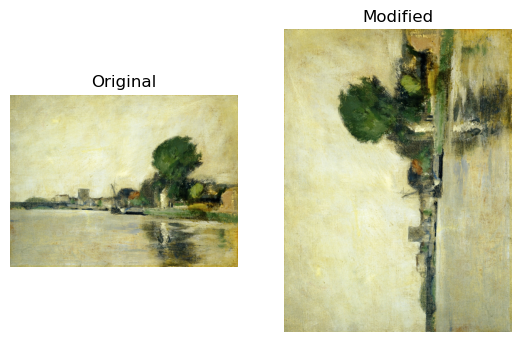

In [172]:
img = tf.io.read_file(X_train[0])
img = tf.image.decode_jpeg(img)
mod_img = data_modification_function(img)
fig = plt.figure(figsize=(10, 10))

fig.add_subplot(2, 3, 1)
plt.imshow(img)
plt.axis('off')
plt.title("Original")

fig.add_subplot(2, 3, 2)
plt.imshow(mod_img)
plt.axis('off')
plt.title("Modified")


In [173]:
#create the structure of the folders
import shutil

path_dataset = './multi_class_dataset_splitted_balanced/'
path_train = path_dataset + 'train/'
path_validation = path_dataset + 'validation/'
path_test = path_dataset + 'test/'

path_train_amusement = path_train + 'amusement/'
path_train_awe = path_train + 'awe/'
path_train_contentment = path_train + 'contentment/'
path_train_disgust = path_train + 'disgust/'
path_train_excitement = path_train + 'excitement/'
path_train_fear = path_train + 'fear/'
path_train_sadness = path_train + 'sadness/'

path_validation_amusement = path_validation + 'amusement/'
path_validation_awe = path_validation + 'awe/'
path_validation_contentment = path_validation + 'contentment/'
path_validation_disgust = path_validation + 'disgust/'
path_validation_excitement = path_validation + 'excitement/'
path_validation_fear = path_validation + 'fear/'
path_validation_sadness = path_validation + 'sadness/'

path_test_amusement = path_test + 'amusement/'
path_test_awe = path_test + 'awe/'
path_test_contentment = path_test + 'contentment/'
path_test_disgust = path_test + 'disgust/'
path_test_excitement = path_test + 'excitement/'
path_test_fear = path_test + 'fear/'
path_test_sadness = path_test + 'sadness/'


In [175]:
shutil.rmtree(path_dataset, ignore_errors=True)

os.makedirs(path_dataset)
os.makedirs(path_train)
os.makedirs(path_validation)
os.makedirs(path_test)

os.makedirs(path_train_amusement)
os.makedirs(path_train_awe)
os.makedirs(path_train_contentment)
os.makedirs(path_train_disgust)
os.makedirs(path_train_excitement)
os.makedirs(path_train_fear)
os.makedirs(path_train_sadness)

os.makedirs(path_validation_amusement)
os.makedirs(path_validation_awe)
os.makedirs(path_validation_contentment)
os.makedirs(path_validation_disgust)
os.makedirs(path_validation_excitement)
os.makedirs(path_validation_fear)
os.makedirs(path_validation_sadness)

os.makedirs(path_test_amusement)
os.makedirs(path_test_awe)
os.makedirs(path_test_contentment)
os.makedirs(path_test_disgust)
os.makedirs(path_test_excitement)
os.makedirs(path_test_fear)
os.makedirs(path_test_sadness)

In [176]:
save_set(X_test, y_test, path_test)
save_set(X_val, y_val, path_validation)

In [177]:
save_set(amusement_train_sample, 'amusement', path_train, False)
save_set(awe_train_sample, 'awe', path_train, False)
save_set(contentment_train_sample, 'contentment', path_train, False)
save_set(disgust_train_sample, 'disgust', path_train, False)
save_set(excitement_train_sample, 'excitement', path_train, False)
save_set(fear_train_sample, 'fear', path_train, False)
save_set(sadness_train_sample, 'sadness', path_train, False)

In [178]:
data_augmentation_minority_class_multi(amusement_train_sample, 'amusement', path_train, len(amusement_train_sample))
data_augmentation_minority_class_multi(awe_train_sample, 'awe', path_train, len(awe_train_sample))
#data_augmentation_minority_class_multi(contentment_train_sample, 'contentment', path_train, len(contentment_train_sample))
data_augmentation_minority_class_multi(disgust_train_sample, 'disgust', path_train, len(disgust_train_sample))
data_augmentation_minority_class_multi(excitement_train_sample, 'excitement', path_train, len(excitement_train_sample))
data_augmentation_minority_class_multi(fear_train_sample, 'fear', path_train, len(fear_train_sample))
data_augmentation_minority_class_multi(sadness_train_sample, 'sadness', path_train, len(sadness_train_sample))


fine loop
4000
fine loop
4000
fine loop
fine loop
fine loop
fine loop
fine loop
fine loop
fine loop
fine loop
fine loop
fine loop
fine loop
4000
fine loop
fine loop
fine loop
fine loop
fine loop
4000
fine loop
4000
fine loop
4000
fine loop
